In [1]:
import pdftotext

In [2]:
with open("/Users/shiqinchoo/Desktop/summary/mgbio.pdf","rb") as f:
    pdf = pdftotext.PDF(f)

In [3]:
len(pdf)

200

In [4]:
type(pdf)

pdftotext.PDF

In [5]:
str(pdf)

'<pdftotext.PDF object at 0x7fb638650418>'

In [6]:
type(pdf)

pdftotext.PDF

In [7]:
pdf = "\n\n".join(pdf)

In [8]:
f2 = open("/Users/shiqinchoo/Desktop/summary/mgbio2.txt","w+")
f2.write(pdf)
f2.close()

In [9]:
j = open("/Users/shiqinchoo/Desktop/summary/mgclimate/climate2.txt","w+")

In [10]:
with open("/Users/shiqinchoo/Desktop/summary/mgclimate/mgclimate.pdf","rb") as k:
    pdf = pdftotext.PDF(k)

In [11]:
k = "\n\n".join(pdf)

In [12]:
j.write(k)

685510

In [13]:
type(k)

str

In [14]:
import spacy
nlp = spacy.load('/opt/anaconda3/lib/python3.7/site-packages/en_core_web_lg/en_core_web_lg-2.2.5/')
from spacy.lang.en import English
parser = English()

def tokenize(text):
    lda_tokens = []
    tokens = parser(text)
    for token in tokens:
        if token.orth_.isspace():
            continue
        elif token.like_url:
            lda_tokens.append('URL')
        elif token.orth_.startswith('@'):
            lda_tokens.append('SCREEN_NAME')
        else:
            lda_tokens.append(token.lower_)
    return lda_tokens

In [15]:
import pandas as pd
import os

In [16]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/shiqinchoo/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [17]:
from nltk.corpus import wordnet as wn
def get_lemma(word):
    lemma = wn.morphy(word)
    if lemma is None:
        return word
    else:
        return lemma
    
from nltk.stem.wordnet import WordNetLemmatizer
def get_lemma2(word):
    return WordNetLemmatizer().lemmatize(word)

In [18]:
nltk.download('stopwords')
en_stop = set(nltk.corpus.stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/shiqinchoo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [19]:
def prepare_text_for_lda(text):
    tokens = tokenize(text)
    tokens = [token for token in tokens if len(token) > 4]
    tokens = [token for token in tokens if token not in en_stop]
    tokens = [get_lemma(token) for token in tokens]
    return tokens

In [20]:
import random
#get tokens
text_data=[]
with open('/Users/shiqinchoo/Desktop/summary/mgclimate/climate2.txt','r') as f:
    for line in f:
        tokens = prepare_text_for_lda(line)
        if random.random() > .99:
            print(tokens)
            text_data.append(tokens)

['microeconomic', 'industry', 'trend', 'better', 'ramaswamy', 'jaana', 'remes']
['shanghai']
[]
['civilization', 'earth', 'climate', 'natural', 'capital', '1901–25', 'would', 'increase']
['transition', 'liability', 'risk.2', 'focus', 'transition', 'risk', 'impact']
['climate', 'response', 'physical', 'hazard', 'socioeconomic', 'impact']
['adaptation', 'build', 'exist', 'literature', 'expert', 'interview', 'understand']
['critical', 'importance', 'decarbonization', 'climate', 'management', 'approach']
['regional', 'analysis', 'technique', 'result', 'capture', 'expert', 'interview', 'understand']
['decade', 'overall', 'climatic', 'socioeconomic', 'response', 'outcome', 'consider']
[]
['warm', 'degree', 'southern', 'parts', 'africa', 'arctic', 'average', 'temperature']
['1950–81']
[]
['system', 'threshold', 'breach', 'knock', 'effects']
['define', 'lethal', 'three', 'period', 'maximum', 'daily', 'temperature', 'exceed', 'degree']
['though', 'region', 'include', 'australia', 'india', 'phil

In [21]:
import gensim
from gensim.utils import simple_preprocess
# Build the bigram and trigram models
bigram = gensim.models.Phrases(text_data, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[text_data], threshold=100)
# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [22]:
# NLTK Stop words
# import nltk
# nltk.download('stopwords')
from nltk.corpus import stopwords

In [23]:
stop_words = stopwords.words('english')

In [24]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]
def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [25]:
import spacy
# Remove Stop Words
data_words_nostops = remove_stopwords(text_data)
# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

In [26]:
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

In [27]:
import gensim.corpora as corpora
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)
# Create Corpus
texts = data_lemmatized
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:10])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1)], [], [], [(5, 1), (6, 1), (7, 1), (8, 1), (9, 1)], [(10, 1), (11, 1), (12, 1), (13, 2), (14, 2)], [(11, 1), (15, 1), (16, 1), (17, 1)], [(18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1)], [(25, 1), (26, 1), (27, 1), (28, 1), (29, 1)], [(21, 1), (22, 1), (24, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1)], [(17, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1)]]


In [28]:
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=10, 
                                       random_state=100,
                                       chunksize=100,
                                       passes=10,
                                       per_word_topics=True)

In [29]:
from pprint import pprint
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.043*"average" + 0.023*"hour" + 0.023*"adaptation" + 0.023*"understand" + '
  '0.023*"interview" + 0.023*"expert" + 0.023*"expect" + 0.023*"different" + '
  '0.023*"number" + 0.023*"statistically"'),
 (1,
  '0.053*"adaptation" + 0.053*"climate" + 0.053*"scale" + 0.028*"approach" + '
  '0.028*"increase" + 0.028*"critical" + 0.028*"importance" + '
  '0.028*"significantly" + 0.028*"management" + 0.028*"loss"'),
 (2,
  '0.024*"temperature" + 0.024*"system" + 0.024*"area" + 0.024*"threshold" + '
  '0.024*"rise" + 0.024*"country" + 0.024*"example" + 0.024*"expect" + '
  '0.024*"design" + 0.024*"water"'),
 (3,
  '0.037*"increase" + 0.037*"risk" + 0.037*"consider" + 0.037*"transition" + '
  '0.020*"decade" + 0.019*"impact" + 0.019*"socioeconomic" + 0.019*"outcome" + '
  '0.019*"focus" + 0.019*"response"'),
 (4,
  '0.052*"probability" + 0.052*"annual" + 0.040*"climate" + 0.027*"hazard" + '
  '0.027*"period" + 0.027*"lethal" + 0.014*"population" + 0.014*"lead" + '
  '0.014*"regional" + 

In [30]:
# supporting function
from gensim.models import CoherenceModel
def compute_coherence_values(corpus, dictionary, k, a, b):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=10, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=a,
                                           eta=b,
                                           per_word_topics=True)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [31]:
import pyLDAvis.gensim
import pickle 
import pyLDAvis
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
LDAvis_prepared

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.175391  0.079070       1        1  16.456633
5      0.026413 -0.170477       2        1  14.645432
6     -0.080025 -0.019202       3        1  10.624511
3     -0.065517  0.082656       4        1  10.326549
7      0.034478 -0.054070       5        1   9.489039
8     -0.085789  0.003381       6        1   8.963272
0      0.003627  0.049441       7        1   8.248750
9      0.053128 -0.008014       8        1   7.737330
2     -0.063834  0.047985       9        1   7.715095
1      0.002127 -0.010771      10        1   5.793386, topic_info=    Category      Freq            Term     Total  loglift  logprob
60   Default  4.000000          region  4.000000  30.0000  30.0000
26   Default  8.000000         climate  8.000000  29.0000  29.0000
18   Default  2.000000      adaptation  2.000000  28.0000  28.0000
79   Default  3.000000     probability  3.000000  27.0000  27.0000
147  Default  2.000000            wave  2.000000  26.0000  26.0000
76   Default  3.000000          annual  3.000000  25.0000  25.0000
145  Default  1.000000           scale  1.000000  24.0000  24.0000
7    Default  3.000000        increase  3.000000  23.0000  23.0000
84   Default  2.000000         country  2.000000  22.0000  22.0000
13   Default  2.000000            risk  2.000000  21.0000  21.0000
148  Default  2.000000         average  2.000000  20.0000  20.0000
64   Default  3.000000           level  3.000000  19.0000  19.0000
89   Default  2.000000          stress  2.000000  18.0000  18.0000
58   Default  3.000000         include  3.000000  17.0000  17.0000
36   Default  2.000000        consider  2.000000  16.0000  16.0000
62   Default  1.000000           curve  1.000000  15.0000  15.0000
162  Default  2.000000  classification  2.000000  14.0000  14.0000
104  Default  3.000000          change  3.000000  13.0000  13.0000
37   Default  2.000000          decade  2.000000  12.0000  12.0000
14   Default  1.000000      transition  1.000000  11.0000  11.0000
87   Default  2.000000          expect  2.000000  10.0000  10.0000
43   Default  3.000000     temperature  3.000000   9.0000   9.0000
56   Default  2.000000          period  2.000000   8.0000   8.0000
68   Default  2.000000         example  2.000000   7.0000   7.0000
25   Default  1.000000        approach  1.000000   6.0000   6.0000
54   Default  2.000000          lethal  2.000000   5.0000   5.0000
90   Default  1.000000           water  1.000000   4.0000   4.0000
132  Default  1.000000         warming  1.000000   3.0000   3.0000
46   Default  2.000000          effect  2.000000   2.0000   2.0000
48   Default  2.000000          system  2.000000   1.0000   1.0000
..       ...       ...             ...       ...      ...      ...
118  Topic10  0.048657   physiological  1.158296  -0.3215  -5.9736
88   Topic10  0.048657      livability  1.158296  -0.3215  -5.9736
69   Topic10  0.048657           other  1.158296  -0.3215  -5.9736
120  Topic10  0.048657           world  1.158296  -0.3215  -5.9736
83   Topic10  0.048657        continue  1.159848  -0.3228  -5.9736
85   Topic10  0.048657             hot  1.159848  -0.3228  -5.9736
160  Topic10  0.048657          repair  1.159848  -0.3228  -5.9736
183  Topic10  0.048657         measure  1.159848  -0.3228  -5.9736
158  Topic10  0.048657         exhibit  1.159848  -0.3228  -5.9736
184  Topic10  0.048657      mitigation  1.159848  -0.3228  -5.9736
182  Topic10  0.048657       important  1.159848  -0.3228  -5.9736
159  Topic10  0.048657        possibly  1.159848  -0.3228  -5.9736
19   Topic10  0.048657           build  1.159849  -0.3228  -5.9736
172  Topic10  0.048657   statistically  1.159849  -0.3228  -5.9736
20   Topic10  0.048657           exist  1.159849  -0.3228  -5.9736
171  Topic10  0.048657          number  1.159849  -0.3228  -5.9736
169  Topic10  0.048657       different  1.159849  -0.3228  -5.9736
148  Topic10  0.048657    

In [32]:
lda_model50 = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=50, 
                                       random_state=100,
                                       chunksize=100,
                                       passes=10,
                                       per_word_topics=True)

from pprint import pprint
# Print the Keyword in the 25 topics
pprint(lda_model50.print_topics())
doc_lda50 = lda_model50[corpus]

import pyLDAvis.gensim
import pickle 
import pyLDAvis
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim.prepare(lda_model50, corpus, id2word, mds='mmds')
LDAvis_prepared

[(17,
  '0.059*"guide" + 0.059*"consider" + 0.059*"outcome" + 0.059*"climatic" + '
  '0.059*"response" + 0.059*"socioeconomic" + 0.059*"economy" + '
  '0.059*"transform" + 0.059*"observe" + 0.059*"decade"'),
 (38,
  '0.083*"period" + 0.083*"maximum" + 0.083*"lethal" + 0.083*"exceed" + '
  '0.083*"temperature" + 0.083*"daily" + 0.083*"degree" + 0.083*"define" + '
  '0.002*"significantly" + 0.002*"average"'),
 (49,
  '0.005*"approximately" + 0.005*"locally" + 0.005*"equal" + 0.005*"shade" + '
  '0.005*"equivalent" + 0.005*"significantly" + 0.005*"manifest" + '
  '0.005*"precipitation" + 0.005*"year" + 0.005*"wave"'),
 (36,
  '0.140*"controversy" + 0.140*"global" + 0.140*"warming" + 0.003*"equivalent" '
  '+ 0.003*"approximately" + 0.003*"manifest" + 0.003*"equal" + '
  '0.003*"locally" + 0.003*"likelihood" + 0.003*"precipitation"'),
 (11,
  '0.005*"approximately" + 0.005*"locally" + 0.005*"equal" + 0.005*"shade" + '
  '0.005*"equivalent" + 0.005*"significantly" + 0.005*"manifest" + '
  '

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
33     0.310621  0.161839       1        1  6.544359
43     0.003742 -0.337763       2        1  5.275844
30    -0.078336 -0.305199       3        1  4.695035
35    -0.240235 -0.218717       4        1  4.680604
40     0.155094 -0.277174       5        1  4.400421
37     0.324000 -0.088815       6        1  4.314083
21    -0.255193 -0.167033       7        1  4.312038
19     0.252584 -0.193280       8        1  4.091860
3     -0.105015  0.347265       9        1  4.013218
1      0.293087  0.107567      10        1  3.809254
17    -0.148623 -0.245413      11        1  3.715598
47    -0.296463 -0.044721      12        1  3.419783
0     -0.276477  0.128531      13        1  3.137797
6      0.134894  0.274153      14        1  3.126854
25    -0.286856  0.055437      15        1  3.126854
45    -0.168771  0.209398      16        1  3.055918
16    -0.204203  0.175157      17        1  2.755641
38     0.192395  0.159477      18        1  2.455979
46    -0.218617  0.001882      19        1  2.455979
27     0.240478 -0.021985      20        1  2.245541
23    -0.097087 -0.177215      21        1  2.240491
41     0.023143 -0.202848      22        1  2.157158
20     0.211332 -0.081954      23        1  2.018269
5      0.090670 -0.136128      24        1  1.859539
29     0.035318  0.232771      25        1  1.859539
44     0.107906 -0.166427      26        1  1.859539
42    -0.077125  0.173964      27        1  1.563723
26     0.088584  0.170686      28        1  1.563723
24    -0.109351 -0.043934      29        1  1.270794
9     -0.007838  0.165413      30        1  1.270794
36    -0.057371  0.094116      31        1  0.982916
22     0.008616  0.013208      32        1  0.301098
39     0.008616  0.013208      33        1  0.301098
2      0.008616  0.013208      34        1  0.301098
4      0.008616  0.013208      35        1  0.301098
34     0.008616  0.013208      36        1  0.301098
32     0.008616  0.013208      37        1  0.301098
7      0.008616  0.013208      38        1  0.301098
8      0.008616  0.013208      39        1  0.301098
10     0.008616  0.013208      40        1  0.301098
48     0.008616  0.013208      41        1  0.301098
11     0.008616  0.013208      42        1  0.301098
12     0.008616  0.013208      43        1  0.301098
13     0.008616  0.013208      44        1  0.301098
14     0.008616  0.013208      45        1  0.301098
15     0.008616  0.013208      46        1  0.301098
31     0.008616  0.013208      47        1  0.301098
28     0.008616  0.013208      48        1  0.301098
18     0.008616  0.013208      49        1  0.301098
49     0.008616  0.013208      50        1  0.301098, topic_info=    Category      Freq            Term     Total  loglift  logprob
60   Default  4.000000          region  4.000000  30.0000  30.0000
26   Default  9.000000         climate  9.000000  29.0000  29.0000
58   Default  3.000000         include  3.000000  28.0000  28.0000
18   Default  2.000000      adaptation  2.000000  27.0000  27.0000
7    Default  3.000000        increase  3.000000  26.0000  26.0000
64   Default  3.000000           level  3.000000  25.0000  25.0000
79   Default  4.000000     probability  4.000000  24.0000  24.0000
84   Default  3.000000         country  3.000000  23.0000  23.0000
43   Default  3.000000     temperature  3.000000  22.0000  22.0000
56   Default  2.000000          period  2.000000  21.0000  21.0000
11   Default  4.000000          impact  4.000000  20.0000  20.0000
76   Default  3.000000          annual  3.000000  19.0000  19.0000
62   Default  1.000000           curve  1.000000  18.0000  18.0000
13   Default  3.000000            risk  3.000000  17.0000  17.0000
37   Default  2.000000          decade  2.000000  16.0000  16.0000
148  Default  2.000000         average  2.000000  15.0000  15.0000
48   Default  2.000000          system  2.000000  14.0000  14.

In [33]:
import neuralcoref

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: spacy.morphology.Morphology size changed, may indicate binary incompatibility. Expected 104 from C header, got 112 from PyObject
  return f(*args, **kwds)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: spacy.vocab.Vocab size changed, may indicate binary incompatibility. Expected 96 from C header, got 104 from PyObject
  return f(*args, **kwds)


In [34]:
neuralcoref.add_to_pipe(nlp)

In [35]:
f = open('/Users/shiqinchoo/Desktop/summary/mgclimate/climate2.txt','r')
g = f.read()

In [36]:
doc = nlp(g)

In [37]:
entities = [ent.text for ent in doc.ents]

len(entities)

8726

In [38]:
labels = [ent.label_ for ent in doc.ents]

len(labels)

8726

In [39]:
doc_ents = pd.DataFrame()
doc_ents['entities'] = entities
doc_ents['labels'] = labels

df = doc_ents.groupby(['entities', 'labels']).size()
df = df.to_frame(name='size').sort_values(by = 'size', ascending=False).reset_index()

In [40]:
import pandas as pd
import re


def entity_pairs(text, coref=True):
    text = re.sub(r'\n+', '.', text)  # replace multiple newlines with period
    text = re.sub(r'\[\d+\]', ' ', text)  # remove reference numbers
    text = nlp(text)
    if coref:
        text = nlp(text._.coref_resolved)  # resolve coreference clusters
    sentences = [sent.string.strip() for sent in text.sents]  # split text into sentences
    ent_pairs = list()
    for sent in sentences:
        sent = nlp(sent)
        spans = list(sent.ents) + list(sent.noun_chunks)  # collect nodes
        spans = spacy.util.filter_spans(spans)
        with sent.retokenize() as retokenizer:
            [retokenizer.merge(span) for span in spans]
        dep = [token.dep_ for token in sent]
        if (dep.count('obj')+dep.count('dobj'))==1 \
                and (dep.count('subj')+dep.count('nsubj'))==1:
            for token in sent:
                if token.dep_ in ('obj', 'dobj'):  # identify object nodes
                    subject = [w for w in token.head.lefts if w.dep_
                               in ('subj', 'nsubj')]  # identify subject nodes
                    if subject:
                        subject = subject[0]
                        # identify relationship by root dependency
                        relation = [w for w in token.ancestors if w.dep_ == 'ROOT']  
                        if relation:
                            relation = relation[0]
                            # add adposition or particle to relationship
                            if relation.nbor(1).pos_ in ('ADP', 'PART'):  
                                relation = ' '.join((str(relation),
                                        str(relation.nbor(1))))
                        else:
                            relation = 'unknown'
                        subject, subject_type = refine_ent(subject, sent)
                        token, object_type = refine_ent(token, sent)
                        ent_pairs.append([str(subject), str(relation), str(token),
                                str(subject_type), str(object_type)])
    filtered_ent_pairs = [sublist for sublist in ent_pairs
                          if not any(str(x) == '' for x in sublist)]
    pairs = pd.DataFrame(filtered_ent_pairs, columns=['subject',
                         'relation', 'object', 'subject_type',
                         'object_type'])
    print('Entity pairs extracted:', str(len(filtered_ent_pairs)))
    return pairs


def refine_ent(ent, sent):
    unwanted_tokens = (
        'PRON',  # pronouns
        'PART',  # particle
        'DET',  # determiner
        'SCONJ',  # subordinating conjunction
        'PUNCT',  # punctuation
        'SYM',  # symbol
        'X',  # other
        )
    ent_type = ent.ent_type_  # get entity type
    if ent_type == '':
        ent_type = 'NOUN_CHUNK'
        ent = ' '.join(str(t.text) for t in
                nlp(str(ent)) if t.pos_
                not in unwanted_tokens and t.is_stop == False)
    elif ent_type in ('NOMINAL', 'CARDINAL', 'ORDINAL') and str(ent).find(' ') == -1:
        t = ''
        for i in range(len(sent) - ent.i):
            if ent.nbor(i).pos_ not in ('VERB', 'PUNCT'):
                t += ' ' + str(ent.nbor(i))
            else:
                ent = t.strip()
                break
    return ent, ent_type

In [41]:
h = entity_pairs(g)
len(h)

Entity pairs extracted: 333


333

In [42]:
org_kg = h[(h['subject_type']=='ORG') | (h['object_type']=='ORG')]
org_kg

,subject,relation,object,subject_type,object_type
2,MGI,have,MGI senior fellow,ORG,NOUN_CHUNK
5,McKinsey,developed,McKinsey global greenhouse gas abatement cost ...,ORG,NOUN_CHUNK
7,Birshan,provided,critical input,ORG,NOUN_CHUNK
8,Woods Hole Research Center,produced,scientific,ORG,NOUN_CHUNK
9,the University of Oxford’s Environmental Chang...,ensure,impartiality,ORG,NOUN_CHUNK
12,Organizations,include,AECOM,NOUN_CHUNK,ORG
22,McKinsey,has,long history,ORG,NOUN_CHUNK
84,Intensifying climate.hazards,put,millions of lives at risk,ORG,CARDINAL
126,Each RCP,predicts,global average.warming,ORG,NOUN_CHUNK
136,the US Department of Defense,identified,climate change,ORG,NOUN_CHUNK


In [43]:
gpe_kg = h[(h['subject_type']=='GPE') | (h['object_type']=='GPE')]

In [44]:
gpe_kg

,subject,relation,object,subject_type,object_type
96,group,includes,the Philippines,NOUN_CHUNK,GPE
98,group,includes,Colombia,NOUN_CHUNK,GPE
100,group,includes,Germany,NOUN_CHUNK,GPE
102,Examples,include,Argentina,NOUN_CHUNK,GPE
161,rising temperatures,impact,India,NOUN_CHUNK,GPE
187,India,has,potential,GPE,NOUN_CHUNK
205,Hurricane Harvey,Texas,Houston,EVENT,GPE
254,China,see,expected yields,GPE,NOUN_CHUNK
262,group,includes,the Philippines,NOUN_CHUNK,GPE
263,group,includes,Colombia,NOUN_CHUNK,GPE


In [45]:
import networkx as nx
import matplotlib.pyplot as plt


def draw_kg(pairs):
    k_graph = nx.from_pandas_edgelist(pairs, 'subject', 'object',
            create_using=nx.MultiDiGraph())
    node_deg = nx.degree(k_graph)
    layout = nx.spring_layout(k_graph, k=0.15, iterations=20)
    plt.figure(num=None, figsize=(200, 150), dpi=80)
    nx.draw_networkx(
        k_graph,
        node_size=[int(deg[1]) * 500 for deg in node_deg],
        arrowsize=50,
        linewidths=13,
        pos=layout,
        font_size = 48,
        edge_color='blue',
        edgecolors='black',
        node_color='white',
        )
    labels = dict(zip(list(zip(pairs.subject, pairs.object)),
                  pairs['relation'].tolist()))
    nx.draw_networkx_edge_labels(k_graph, pos=layout, edge_labels=labels,
                                 font_color='red')
    plt.axis('off')
    plt.show()

In [46]:
draw_kg(h)

In [47]:

def filter_graph(pairs, node):
    k_graph = nx.from_pandas_edgelist(pairs, 'subject', 'object',
            create_using=nx.MultiDiGraph())
    edges = nx.dfs_successors(k_graph, node)
    nodes = []
    for k, v in edges.items():
        nodes.extend([k])
        nodes.extend(v)
    subgraph = k_graph.subgraph(nodes)
    layout = (nx.random_layout(k_graph))
    nx.draw_networkx(
        subgraph,
        node_size=1000,
        arrowsize=20,
        linewidths=3,
        pos=layout,
        font_size = 24,
        edge_color='red',
        edgecolors='black',
        node_color='white'
        )
    labels = dict(zip((list(zip(pairs.subject, pairs.object))),
                    pairs['relation'].tolist()))
    edges= tuple(subgraph.out_edges(data=False))
    sublabels ={k: labels[k] for k in edges}
    print(k_graph.out_edges(data=False))
    nx.draw_networkx_edge_labels(subgraph, pos=layout, edge_labels=sublabels,
                                font_color='red')
    plt.axis('off')
    plt.show()

[('MGI research', 'disciplines'), ('James Manyika', 'Sven Smit'), ('MGI', 'MGI senior fellow'), ('Practice', 'businesses'), ('organizations', 'risk capabilities.sustainable - growth economy'), ('McKinsey', 'McKinsey global greenhouse gas abatement cost curve'), ('McKinsey', 'long history'), ('Quiros', 'modeling'), ('Birshan', 'critical input'), ('Woods Hole Research Center', 'scientific'), ('the University of Oxford’s Environmental Change Institute', 'impartiality'), ('Carlos Sanchez', 'resilient finance'), ('number', 'number'), ('Organizations', 'AECOM'), ('Multiple groups', 'Multiple groups'), ('colleagues', 'valuable input'), ('Peter Gumbel', 'Peter Gumbel'), ('Climate science          humidity increase', 'exposed homes.makes extensive use'), ('Poorer regions', 'climates.enables'), ('Climate change', 'exposure'), ('Climate change', 'benefits'), ('Climate change', 'substantial physical impacts'), ('Climate change', 'human life'), ('Climate change', 'measurable socioeconomic impact'),

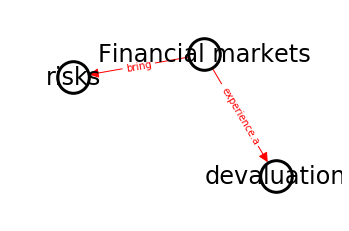

In [48]:
filter_graph(h, 'Financial markets')

In [49]:
draw_kg(gpe_kg)

In [50]:
draw_kg(org_kg)

In [51]:
h

,subject,relation,object,subject_type,object_type
0,MGI research,combines,disciplines,NOUN_CHUNK,NOUN_CHUNK
1,James Manyika,employing,Sven Smit,PERSON,PERSON
2,MGI,have,MGI senior fellow,ORG,NOUN_CHUNK
3,Practice,helps,businesses,NOUN_CHUNK,NOUN_CHUNK
4,organizations,help,risk capabilities.sustainable - growth economy,NOUN_CHUNK,NOUN_CHUNK
5,McKinsey,developed,McKinsey global greenhouse gas abatement cost ...,ORG,NOUN_CHUNK
6,Quiros,provided,modeling,PERSON,NOUN_CHUNK
7,Birshan,provided,critical input,ORG,NOUN_CHUNK
8,Woods Hole Research Center,produced,scientific,ORG,NOUN_CHUNK
9,the University of Oxford’s Environmental Chang...,ensure,impartiality,ORG,NOUN_CHUNK


In [52]:
h2_1 = h[h['subject'].str.contains("climate")]
h2_2 = h[h['object'].str.contains("climate")]
h3 = pd.concat([h2_1, h2_2])
h3

,subject,relation,object,subject_type,object_type
19,changing climate,impact,socioeconomic systems,NOUN_CHUNK,NOUN_CHUNK
42,climate models,indicate,rise,NOUN_CHUNK,NOUN_CHUNK
55,climate hazards,impact,multiple systems,NOUN_CHUNK,NOUN_CHUNK
80,climate events,lack,financial means,NOUN_CHUNK,NOUN_CHUNK
81,climate events,trigger,harvest failure,NOUN_CHUNK,NOUN_CHUNK
82,changing climate,affects,human physical natural capital,NOUN_CHUNK,NOUN_CHUNK
84,Intensifying climate.hazards,put,millions of lives at risk,ORG,CARDINAL
90,Köppen climate system,divides,climates,NOUN_CHUNK,NOUN_CHUNK
101,polar boreal climates,largest increase in,poleward,NOUN_CHUNK,NOUN_CHUNK
113,changing climate,means,likelihoods,NOUN_CHUNK,NOUN_CHUNK


In [53]:
draw_kg(h3)

In [54]:
def get_entities(sent):
  ## chunk 1
  ent1 = ""
  ent2 = ""

  prv_tok_dep = ""    # dependency tag of previous token in the sentence
  prv_tok_text = ""   # previous token in the sentence

  prefix = ""
  modifier = ""

  #############################################################
  
  for tok in nlp(sent):
    ## chunk 2
    # if token is a punctuation mark then move on to the next token
    if tok.dep_ != "punct":
      # check: token is a compound word or not
      if tok.dep_ == "compound":
        prefix = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          prefix = prv_tok_text + " "+ tok.text
      
      # check: token is a modifier or not
      if tok.dep_.endswith("mod") == True:
        modifier = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          modifier = prv_tok_text + " "+ tok.text
      
      ## chunk 3
      if tok.dep_.find("subj") == True:
        ent1 = modifier +" "+ prefix + " "+ tok.text
        prefix = ""
        modifier = ""
        prv_tok_dep = ""
        prv_tok_text = ""      

      ## chunk 4
      if tok.dep_.find("obj") == True:
        ent2 = modifier +" "+ prefix +" "+ tok.text
        
      ## chunk 5  
      # update variables
      prv_tok_dep = tok.dep_
      prv_tok_text = tok.text
  #############################################################

  return [ent1.strip(), ent2.strip()]

In [55]:
doc = nlp(k)

In [56]:
sentences_list = [sent for sent in doc.sents]

In [57]:
len(sentences_list)

6304

In [58]:
type(sentences_list[1])

spacy.tokens.span.Span

In [61]:
sentences_list = [str(sentences_list[i]) for i in range(len(sentences_list))]
print(len(sentences_list))
print(type(sentences_list))

6304
<class 'list'>


In [62]:
print(type(sentences_list[1]))

<class 'str'>


In [63]:
sentences_list = list(filter(None, sentences_list))

In [65]:
import tqdm
entity_pairs = []

for i in range(len(sentences_list)):
  entity_pairs.append(get_entities(sentences_list[i]))

In [66]:
def get_relation(sent):

  doc = nlp(sent)

  # Matcher class object 
  matcher = Matcher(nlp.vocab)

  #define the pattern 
  pattern = [{'DEP':'ROOT'}, 
            {'DEP':'prep','OP':"?"},
            {'DEP':'agent','OP':"?"},  
            {'POS':'ADJ','OP':"?"}] 

  matcher.add("matching_1", None, pattern) 

  matches = matcher(doc)
  k = len(matches) - 1

  span = doc[matches[k][1]:matches[k][2]] 

  return(span.text)



In [70]:
import spacy
from spacy.matcher import Matcher 
from spacy.tokens import Span 
import networkx as nx
import matplotlib.pyplot as plt
relations = [get_relation(sentences_list[i]) for i in range(len(sentences_list))]

In [71]:
# extract subject
source = [i[0] for i in entity_pairs]

# extract object
target = [i[1] for i in entity_pairs]

kg_df2 = pd.DataFrame({'source':source, 'target':target, 'edge':relations})

In [73]:
G=nx.from_pandas_edgelist(kg_df2, "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

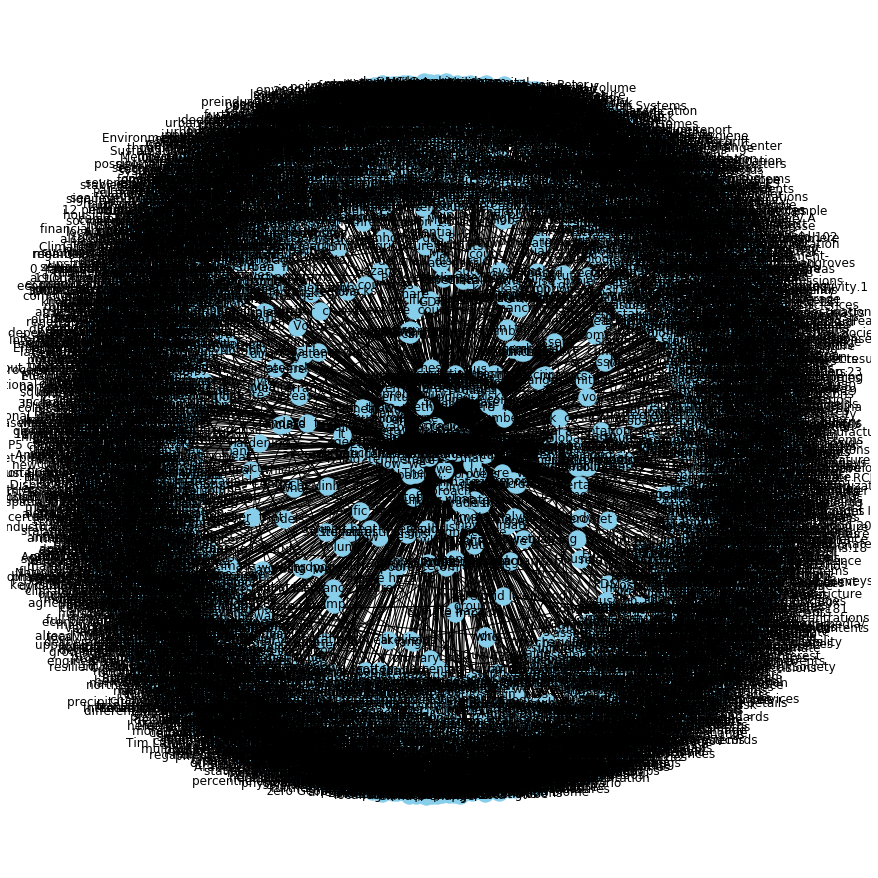

In [74]:
plt.figure(figsize=(12,12))

pos = nx.spring_layout(G)
nx.draw(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

In [75]:
kg_df2.head(20)

,source,target,edge
0,,,risk
1,,,hazards
2,,,January
3,,,Institute
4,,1990,Since
5,Recent partners,digital Global experts,sought to
6,deeper impact,global McKinsey economy,made
7,economic Michael MGI,Chinese Rajat management,includes
8,,,Hazan
9,,,Tonby


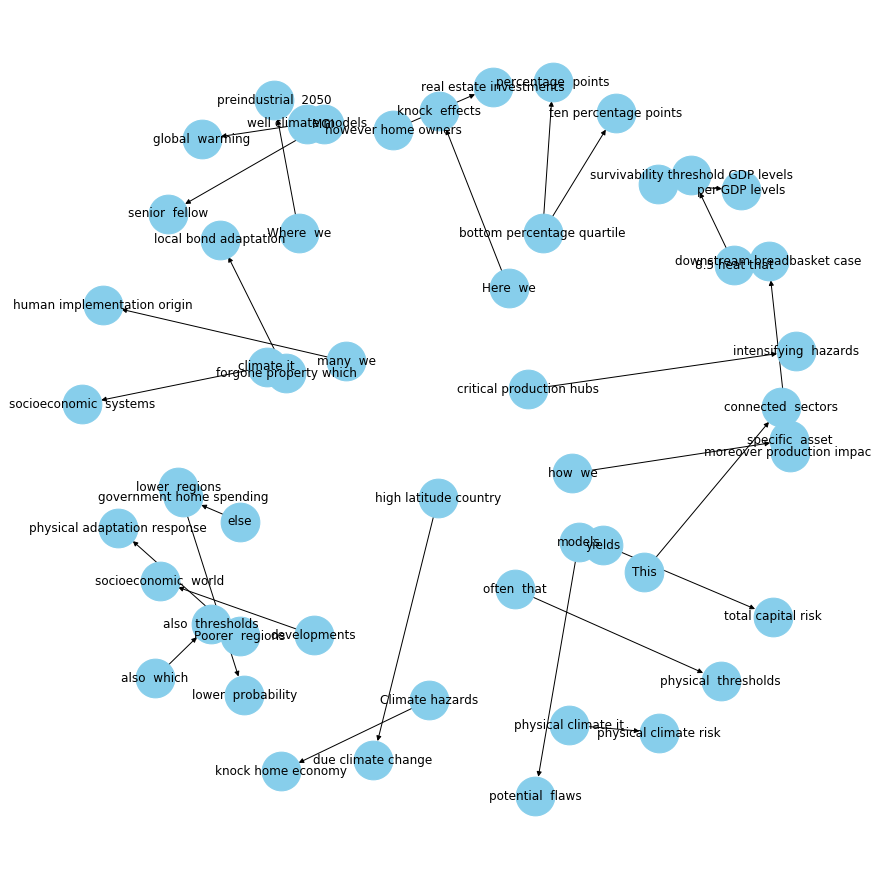

In [76]:
G=nx.from_pandas_edgelist(kg_df2[kg_df2['edge']=="have"], "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

plt.figure(figsize=(12,12))
pos = nx.spring_layout(G, k = 0.5)
nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

In [77]:
len(kg_df2)

6304

In [79]:
edge_count = kg_df2.groupby("edge").size()
edge_count = edge_count.to_frame(name='size').sort_values(by = 'size', ascending=False).reset_index()
edge_count.head(20)

,edge,size
0,is,151
1,risk,77
2,hazards,71
3,are,66
4,expected,66
5,See,61
6,increase,61
7,.,50
8,include,46
9,need,45


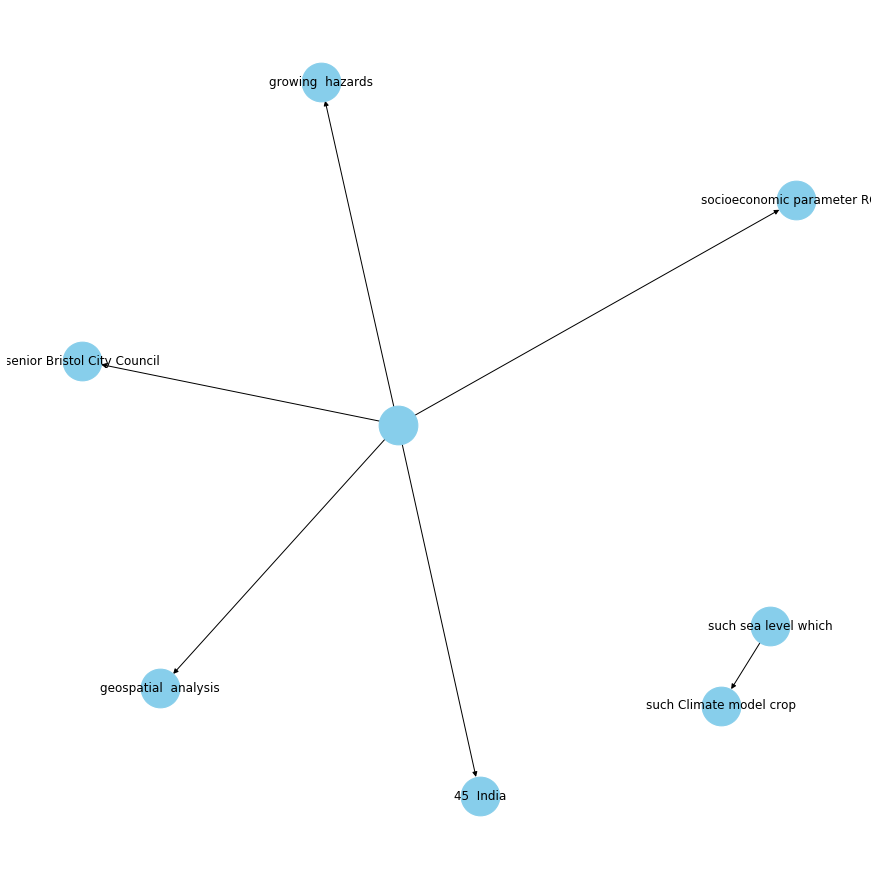

In [82]:
G=nx.from_pandas_edgelist(kg_df2[kg_df2['edge']=="hazards"], "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

plt.figure(figsize=(12,12))
pos = nx.spring_layout(G, k = 0.5)
nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

In [83]:
source_count = kg_df2.groupby("source").size()
source_count = source_count.to_frame(name='size').sort_values(by = 'size', ascending=False).reset_index()
source_count.head(20)

,source,size
0,,3528
1,We,98
2,we,72
3,This,51
4,standard we,32
5,Heat data bias,28
6,that,28
7,Climate state,27
8,why Technical we,23
9,it,21


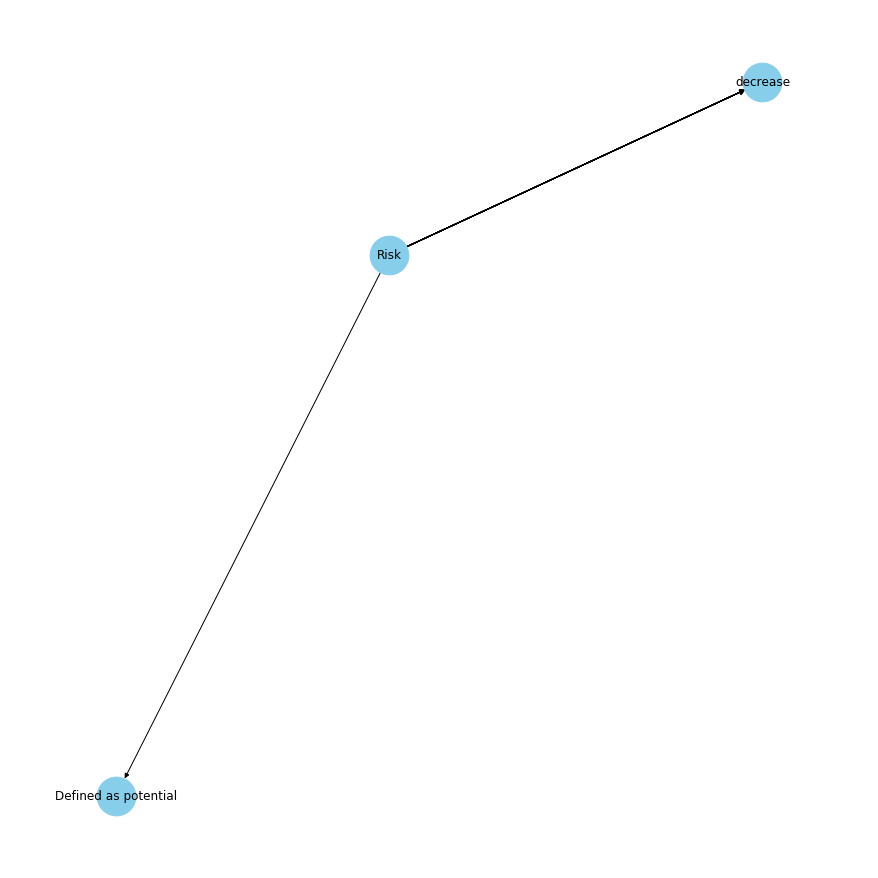

In [84]:
G=nx.from_pandas_edgelist(kg_df2[kg_df2['source']=="Risk"], "source", "edge", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

plt.figure(figsize=(12,12))
pos = nx.spring_layout(G, k = 0.5)
nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

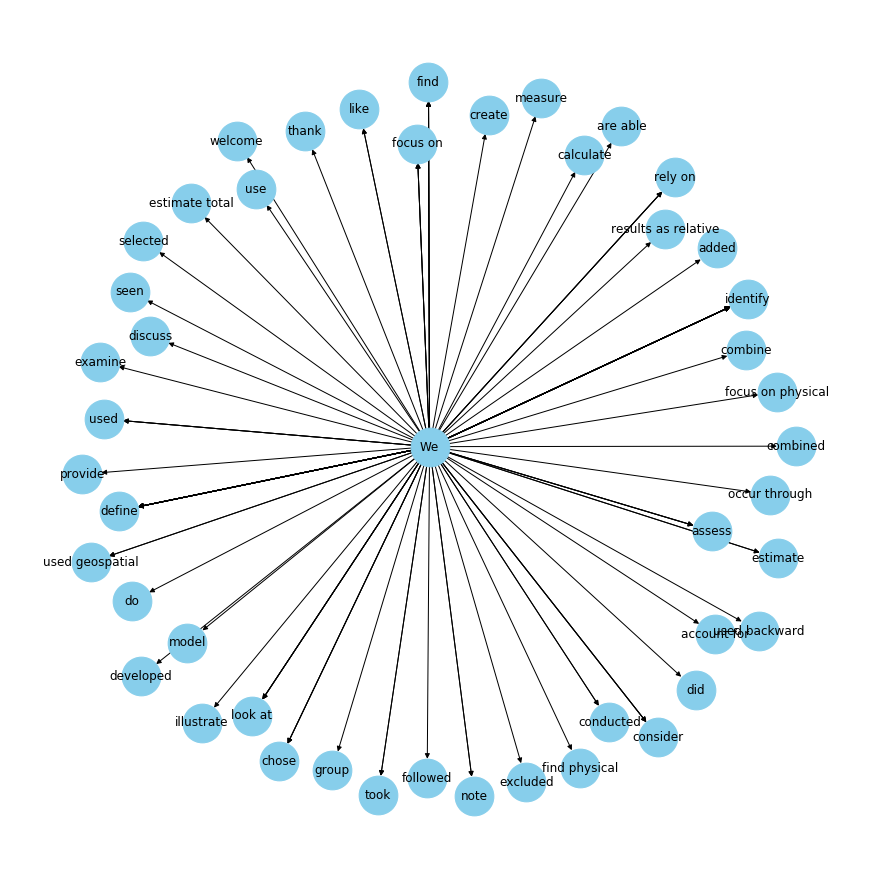

In [85]:
G=nx.from_pandas_edgelist(kg_df2[kg_df2['source']=="We"], "source", "edge", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

plt.figure(figsize=(12,12))
pos = nx.spring_layout(G, k = 0.5)
nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

In [86]:
target_count = kg_df2.groupby("target").size()
target_count = target_count.to_frame(name='size').sort_values(by = 'size', ascending=False).reset_index()
target_count.head(20)

,target,size
0,,2740
1,RCP,61
2,climate change,35
3,climatic multidecade periods,31
4,average 2041,29
5,risk,21
6,atmospheric aerosols,20
7,35 ° C threshold,15
8,changing climate,15
9,annual water,13


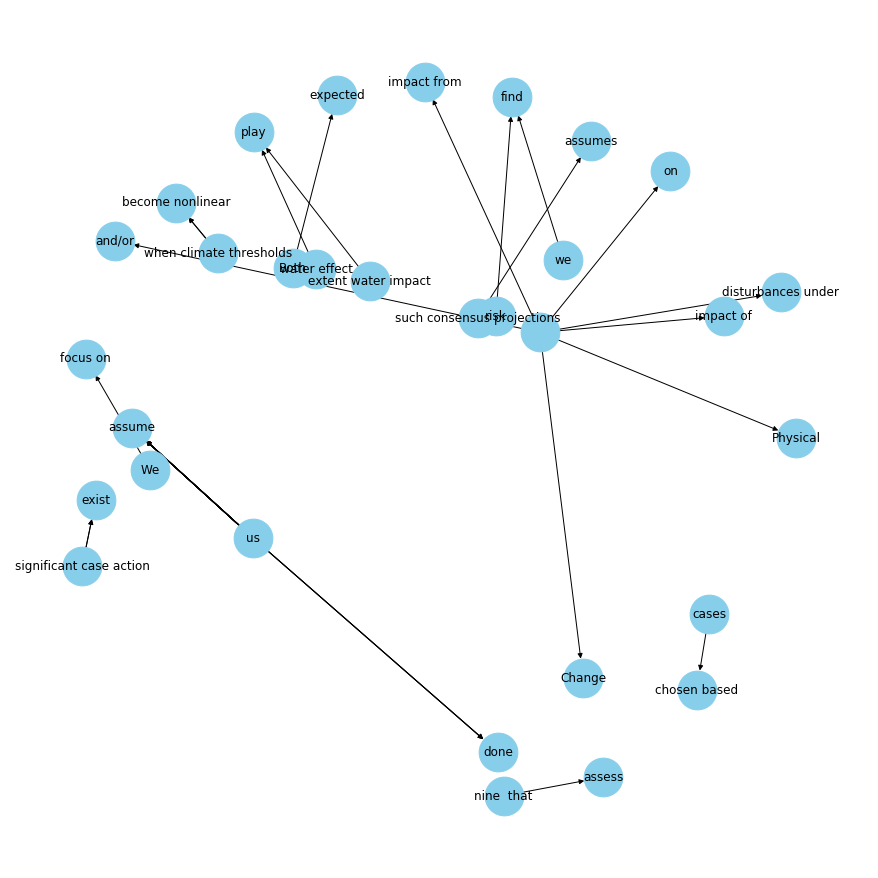

In [88]:
G=nx.from_pandas_edgelist(kg_df2[kg_df2['target']=="climate change"], "source", "edge", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

plt.figure(figsize=(12,12))
pos = nx.spring_layout(G, k = 0.5)
nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)
plt.show()